<a href="https://colab.research.google.com/github/summiyak/NLP_Final_project/blob/main/Dataset_Cartography_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import os
os.chdir('/content/drive/MyDrive/')

Mounted at /content/drive


In [3]:
!pip install -r /content/drive/MyDrive/electra/fp-dataset-artifacts-main/requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.3 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


**Training the model on SNLI dataset to calculate variability and confidence**

In [3]:
import os, json
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from datasets import load_dataset
import matplotlib.pyplot as plt

# Load Electra Small model and tokenizer
model_name = "google/electra-small-discriminator"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)  # 3 labels for SNLI

# Load SNLI dataset
dataset = load_dataset("snli")
train_dataset_a = dataset["train"]
valid_dataset_a = dataset["validation"]

#limit the size to training dataset to 1-0.98%
#train_dataset_a = train_dataset_a.train_test_split(test_size=0.98)["train"]


print(len(train_dataset_a))
print(len(valid_dataset_a))

# Preprocess the dataset
def preprocess_function(examples):
    return tokenizer(examples["premise"], examples["hypothesis"], truncation=True, padding="max_length", max_length=128)

# Fix labels to ensure compatibility
def fix_label(examples):
    examples['label'] = [abs(int(label)) for label in examples['label']]
    return examples

train_dataset_a = train_dataset_a.map(fix_label, batched=True)
valid_dataset_a = valid_dataset_a.map(fix_label, batched=True)

train_dataset = train_dataset_a.map(preprocess_function, batched=True)
valid_dataset = valid_dataset_a.map(preprocess_function, batched=True)

train_dataset = train_dataset.rename_column("label", "labels")
train_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])
valid_dataset = valid_dataset.rename_column("label", "labels")
valid_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# Training arguments
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/electra/cartography/",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=64,
    per_device_eval_batch_size=64,
    num_train_epochs=1,
    weight_decay=0.01,
    logging_dir="/content/drive/MyDrive/electra/cartography/logs",
    logging_steps=500,
    save_total_limit=2,
    fp16=True
)

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    tokenizer=tokenizer
)

# Train the model while collecting predictions for variability
num_passes = 1
all_train_probs = []

for epoch in range(3):
    trainer.train()

    # Collect predictions for variability calculation
    epoch_probs = []
    for _ in range(num_passes):
        predictions = trainer.predict(train_dataset)
        probs = torch.nn.functional.softmax(torch.tensor(predictions.predictions), dim=-1).numpy()
        #print(probs)
        epoch_probs.append(probs)
    all_train_probs.append(np.array(epoch_probs))

all_train_probs = np.array(all_train_probs)


# Example NumPy array (replace with your actual data)

# File path
file_path = "/content/drive/MyDrive/electra/cartography/train_probs.npy"

# Save the array to the file
np.save(file_path, all_train_probs)

print(f"NumPy array saved to: {file_path}")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/54.2M [00:00<?, ?B/s]

Some weights of ElectraForSequenceClassification were not initialized from the model checkpoint at google/electra-small-discriminator and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


README.md:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/412k [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/413k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/19.6M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/550152 [00:00<?, ? examples/s]

550152
10000


Map:   0%|          | 0/550152 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

Map:   0%|          | 0/550152 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
<ipython-input-3-d36f053eb6e3>:62: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Epoch,Training Loss,Validation Loss
1,0.395200,0.338902


Epoch,Training Loss,Validation Loss
1,0.368300,0.319122


Epoch,Training Loss,Validation Loss
1,0.352600,0.309038


NumPy array saved to: /content/drive/MyDrive/electra/cartography/train_probs.npy


In [7]:
import numpy as np

def calculate_variability(predicted_probs, true_labels):
    """
    Calculate variability of model-predicted probabilities.

    Args:
        predicted_probs (numpy.ndarray): Array of shape (epochs, examples, classes),
                                          containing predicted probabilities for each class.
        true_labels (numpy.ndarray): Array of shape (examples,), containing true labels.

    Returns:
        numpy.ndarray: Variability for each example, shape (examples,).
    """
    # Number of epochs and examples
    epochs,passes, examples, classes = np.shape(predicted_probs)

    # Get the predicted probabilities for the true label of each example across epochs
    variability =[0]*examples
    for i in range(examples) :
            temp = []
            for j in range(epochs) :
                temp.append(all_train_probs[j][0][i][true_labels[i]])
            #print(temp)
            variability[i] = np.std(temp)

    return variability

In [8]:
true_labels = np.array(train_dataset_a['label'])
variability = calculate_variability(all_train_probs, true_labels)
print(variability)

[0.0049890704, 0.0012150711, 0.018908292, 0.0073084366, 0.009055772, 0.0008355232, 0.024315866, 0.09923582, 0.066943325, 0.005856656, 0.00059658196, 0.0010072908, 0.0020317817, 0.0008709512, 0.016337428, 0.0131095825, 0.0007068801, 0.1179274, 0.0027670176, 0.0007446191, 0.016972542, 0.0030982348, 0.0020766414, 0.04208144, 0.027377972, 0.0038922234, 0.006019846, 0.07894643, 0.0014810568, 0.0035922606, 0.0028299245, 0.045038722, 0.012568899, 0.044588864, 0.018994667, 0.01349595, 0.08154828, 0.003672719, 0.032464594, 0.0034138395, 0.091964, 0.001188934, 0.05194631, 0.02873664, 0.0036509878, 0.0015772347, 0.044570394, 0.000983631, 0.0007327452, 0.0054836925, 0.008989538, 0.004518877, 0.0059052603, 0.02189455, 0.10703024, 0.008628425, 0.00371511, 0.16330901, 0.041398287, 0.0025377972, 0.07213988, 0.00014181415, 0.049023256, 0.0032864066, 0.07638756, 0.0009824506, 0.09088932, 0.018687902, 0.0077825976, 0.00597933, 0.011202537, 0.031148003, 0.0038137916, 0.026567826, 0.036654785, 0.007357771,

In [10]:
print(np.shape(variability))

(550152,)


In [11]:
# Variability and confidence classification
final_probs = np.mean(all_train_probs, axis=0)  # Average probabilities from the last epoch
std_devs = np.std(all_train_probs, axis=0)     # Standard deviation for variability
confidences = np.max(final_probs, axis=-1)




In [12]:
print(np.shape(confidences))
print(np.shape([variability]))

(1, 550152)
(1, 550152)


In [13]:
confidence_threshold_upper = 0.75
confidence_threshold_lower = 0.5
variability_threshold = 0.25


In [14]:
variability = np.array(variability)
easy_to_learn = (confidences >= confidence_threshold_upper) & (variability <= variability_threshold)
hard_to_learn = (confidences <= confidence_threshold_lower) & (variability <= variability_threshold)
ambiguous = ~((confidences >= confidence_threshold_upper) & (variability <= variability_threshold) | (confidences <= confidence_threshold_lower) & (variability <= variability_threshold))

# Summary statistics
num_easy = np.sum(easy_to_learn)
num_hard = np.sum(hard_to_learn)
num_ambiguous = np.sum(ambiguous)

print(f"Easy to learn examples: {num_easy}")
print(f"Hard to learn examples: {num_hard}")
print(f"Ambiguous examples: {num_ambiguous}")
print(f"Total examples: {num_easy + num_hard + num_ambiguous}")


Easy to learn examples: 462845
Hard to learn examples: 10952
Ambiguous examples: 76355
Total examples: 550152


**Selecting data set from Indices**

In [15]:
ambiguous_indices = np.where(ambiguous)[1]  # Get indices where ambiguous is True
hard_indices = np.where(hard_to_learn)[1]  # Get indices where hard_to_learn is True
easy_indices = np.where(easy_to_learn)[1]  # Get indices where easy_to_learn is True

**Sorting Ambiguous examples based on Variability**

In [16]:
ambiguous_variability = variability[ambiguous_indices]
sorted_indices = ambiguous_indices[np.argsort(-ambiguous_variability)]  # Descending order

ambiguous_variability = variability[sorted_indices]
print(ambiguous_variability)
ambiguous_indices = sorted_indices

[4.6160248e-01 4.5732403e-01 4.5663708e-01 ... 7.4596712e-05 7.2775285e-05
 5.3347812e-05]


In [24]:
print(ambiguous_indices)

[183300  66329 482410 ... 535705 124586 391572]


**Writing examples to the file**

In [11]:
ambiguous_dataset = train_dataset_a.select(ambiguous_indices).to_dict()
hard_dataset = train_dataset_a.select(hard_indices).to_dict()
easy_dataset = train_dataset_a.select(easy_indices).to_dict()


output_path = "/content/drive/MyDrive/electra/cartography/datasets/"


with open(output_path + "easy_examples_small.json", "w") as f:
    json.dump(easy_dataset, f, indent=4)

with open(output_path + "hard_examples_small.json", "w") as f:
    json.dump(hard_dataset, f, indent=4)

with open(output_path + "ambiguous_examples_small.json", "w") as f:
    json.dump(ambiguous_dataset, f, indent=4)

Code for **plotting** confidence vs variability

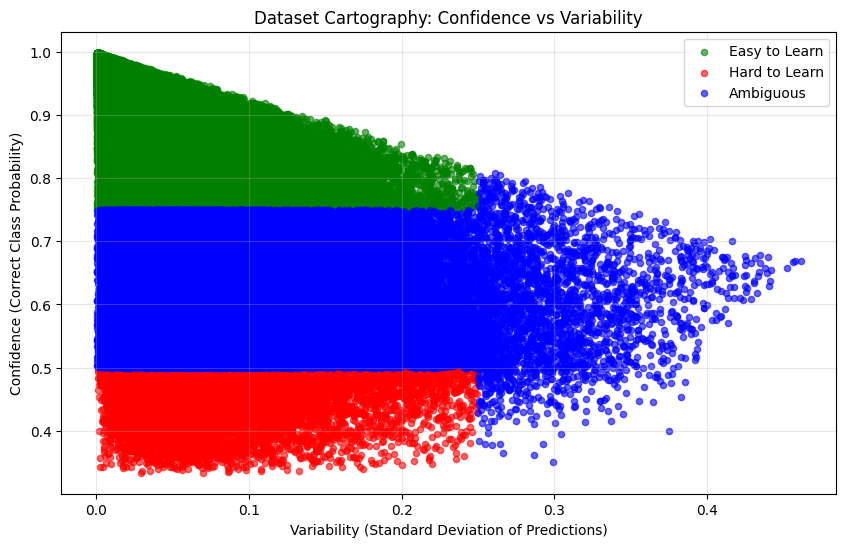

In [12]:
easy_examples = easy_to_learn
hard_examples = hard_to_learn
ambiguous_examples = ambiguous

plt.figure(figsize=(10, 6))

# Plot points for each category
plt.scatter(
    [variability[i] for i in easy_indices],
    [confidences[0][i] for i in easy_indices],
    c="green", label="Easy to Learn", alpha=0.6, s=20
)

plt.scatter(
    [variability[i] for i in hard_examples],
    [confidences[0][i] for i in hard_examples],
    c="red", label="Hard to Learn", alpha=0.6, s=20
)

plt.scatter(
    [variability[i] for i in ambiguous_examples],
    [confidences[0][i] for i in ambiguous_examples],
    c="blue", label="Ambiguous", alpha=0.6, s=20
)

# Add labels and legend
plt.title("Dataset Cartography: Confidence vs Variability")
plt.ylabel("Confidence (Correct Class Probability)")
plt.xlabel("Variability (Standard Deviation of Predictions)")


# Change 'x' to 'y' for axhline to specify the y-coordinate of the horizontal line
#plt.axhline(y=variability_threshold, color='gray', linestyle='--', alpha=0.5, label="Variability Threshold ("+str(variability_threshold)+")")
# No changes needed for axvline as it correctly uses 'y' for the vertical line's x-coordinate
#plt.axvline(x=confidence_threshold, color='gray', linestyle='--', alpha=0.5, label="Confidence Threshold ("+str(confidence_threshold)+")")
#plt.axvline(y=0.5, color='gray', linestyle='--', alpha=0.5, label="Confidence Threshold (0.5)")
plt.legend()
plt.grid(alpha=0.3)


# Show the plot
plt.show()

**Code to Read Numpy Array from file**

In [5]:
import os, json
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from datasets import load_dataset
import matplotlib.pyplot as plt


data = np.load('/content/drive/MyDrive/electra/cartography/train_probs.npy')
all_train_probs = data
print(np.shape(all_train_probs))

(3, 1, 550152, 3)


In [6]:

# Load SNLI dataset
dataset = load_dataset("snli")
train_dataset_a = dataset["train"]
valid_dataset_a = dataset["validation"]

#limit the size to training dataset to 1-0.98%
#train_dataset_a = train_dataset_a.train_test_split(test_size=0.98)["train"]


print(len(train_dataset_a))
print(len(valid_dataset_a))

# Preprocess the dataset
def preprocess_function(examples):
    return tokenizer(examples["premise"], examples["hypothesis"], truncation=True, padding="max_length", max_length=128)

# Fix labels to ensure compatibility
def fix_label(examples):
    examples['label'] = [abs(int(label)) for label in examples['label']]
    return examples

train_dataset_a = train_dataset_a.map(fix_label, batched=True)
valid_dataset_a = valid_dataset_a.map(fix_label, batched=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/412k [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/413k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/19.6M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/550152 [00:00<?, ? examples/s]

550152
10000


Map:   0%|          | 0/550152 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

**Write Ambiguous examples to the file in proper JSON format**

---



In [23]:
from datasets import load_dataset

ambiguous_dataset = train_dataset_a.select(ambiguous_indices) #.to_dict()


output_path = "/content/drive/MyDrive/electra/cartography/datasets/"

# Load the SNLI dataset

dataset_new = {}
print(len(ambiguous_dataset))
print(ambiguous_dataset[0])
with open('/content/drive/MyDrive/electra/cartography/datasets/ambiguous_examples_small.json', 'w') as f:
  for i in range(len(ambiguous_dataset)):
      if ambiguous_dataset[i]['label'] == -1 :
        label = 1
      else :
        label = ambiguous_dataset[i]['label']
      dataset_new.update( {
          'premise' : ambiguous_dataset[i]['premise']
          ,'hypothesis' : ambiguous_dataset[i]['hypothesis']
          , 'label' : label
          })

      json.dump(dataset_new, f)
      f.write('\n')

76355
{'premise': 'An orchestra of about 30 people are practicing on the stage of what appears to be an auditorium full of green chairs.', 'hypothesis': 'An orchestra of about 50 people are practicing.', 'label': 2}


In [25]:
from datasets import load_dataset

easy_dataset = train_dataset_a.select(easy_indices) #.to_dict()


output_path = "/content/drive/MyDrive/electra/cartography/datasets/"

# Load the SNLI dataset

dataset_new = {}
print(len(easy_dataset))
print(easy_dataset[0])
with open('/content/drive/MyDrive/electra/cartography/datasets/easy_examples_small.json', 'w') as f:
  for i in range(len(easy_dataset)):
      if easy_dataset[i]['label'] == -1 :
        label = 1
      else :
        label = easy_dataset[i]['label']
      dataset_new.update( {
          'premise' : easy_dataset[i]['premise']
          ,'hypothesis' : easy_dataset[i]['hypothesis']
          , 'label' : label
          })

      json.dump(dataset_new, f)
      f.write('\n')

462845
{'premise': 'A person on a horse jumps over a broken down airplane.', 'hypothesis': 'A person is training his horse for a competition.', 'label': 1}


In [26]:
ambiguous_dataset = train_dataset_a.select(ambiguous_indices)
print(easy_dataset)

Dataset({
    features: ['premise', 'hypothesis', 'label'],
    num_rows: 462845
})


In [22]:
print(ambiguous_dataset[0])

{'premise': 'An orchestra of about 30 people are practicing on the stage of what appears to be an auditorium full of green chairs.', 'hypothesis': 'An orchestra of about 50 people are practicing.', 'label': 2}


**Train from scratch on Ambiguous dataset**

In [3]:
!python3 /content/drive/MyDrive/electra/fp-dataset-artifacts-main/run.py --do_train --task nli --dataset /content/drive/MyDrive/electra/cartography/datasets/ambiguous_examples_small.json --output_dir /content/drive/MyDrive/electra/cartography/model/

2024-11-26 21:41:09.029828: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-26 21:41:09.049735: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-26 21:41:09.055735: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-26 21:41:09.070645: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 21:41:10.273189: W tensorflow/comp

**Train on Ambiguous examples and test on MNLI Validation Mismatched**

In [4]:
!python3 /content/drive/MyDrive/electra/fp-dataset-artifacts-main/run.py --do_eval --task nli --dataset /content/drive/MyDrive/electra/datasets/mnli.json --model /content/drive/MyDrive/electra/cartography/model/ --output_dir /content/drive/MyDrive/electra/cartography/output_ambiguous/

2024-11-26 22:19:48.501320: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-26 22:19:48.520987: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-26 22:19:48.526920: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-26 22:19:48.541861: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 22:19:49.849449: W tensorflow/comp

**Train on Ambiguous examples and test on MNLI Validation Matched**

In [5]:
!python3 /content/drive/MyDrive/electra/fp-dataset-artifacts-main/run.py --do_eval --task nli --dataset /content/drive/MyDrive/electra/datasets/mnli_matched.json --model /content/drive/MyDrive/electra/cartography/model/ --output_dir /content/drive/MyDrive/electra/cartography/output_ambiguous/

2024-11-26 22:20:55.535302: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-26 22:20:55.570772: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-26 22:20:55.580842: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-26 22:20:55.603531: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 22:20:56.702373: W tensorflow/comp

In [6]:
!python3 /content/drive/MyDrive/electra/fp-dataset-artifacts-main/run.py --do_eval --task nli --dataset snli --model /content/drive/MyDrive/electra/cartography/model/ --output_dir /content/drive/MyDrive/electra/cartography/output_ambiguous/

2024-11-26 22:22:12.290424: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-26 22:22:12.309461: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-26 22:22:12.315259: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-26 22:22:12.329281: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 22:22:13.671605: W tensorflow/comp

In [4]:
import json


json_dataset = []  # Initialize an empty list to store JSON objects
with open("/content/drive/MyDrive/electra/cartography/datasets/ambiguous_dataset_33_percent.json", 'r') as f:
    for line in f:  # Read the file line by line
        try:
            data = json.loads(line)  # Parse each line as a JSON object
            json_dataset.append(data)  # Add the parsed object to the list
        except json.JSONDecodeError as e:
            print(f"Error decoding JSON: {e}, skipping line: {line}")

**Load top 33% ambiguous examples and fine-tune the model on those examples**

In [ ]:
import os, json
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from datasets import load_dataset, Dataset
import matplotlib.pyplot as plt

# Load Electra Small model and tokenizer

model_dir = "/content/drive/MyDrive/electra/trained_model/"  # Replace with your model directory
tokenizer = AutoTokenizer.from_pretrained(model_dir)
model = AutoModelForSequenceClassification.from_pretrained(model_dir, num_labels=3)  # 3 labels for SNLI

# Load SNLI dataset
#dataset = load_dataset("/content/drive/MyDrive/electra/cartography/datasets/ambiguous_examples_small.json")
dataset = Dataset.from_list(json_dataset)
train_dataset_a = dataset

dataset_snli = load_dataset("snli")
valid_dataset_a = dataset_snli["validation"]
valid_dataset_a = valid_dataset_a.train_test_split(test_size=0.70)["train"]

#limit the size to training dataset to 1-0.98%
#train_dataset_a = train_dataset_a.train_test_split(test_size=0.98)["train"]


print(len(train_dataset_a))
print(len(valid_dataset_a))

# Preprocess the dataset
def preprocess_function(examples):
    return tokenizer(examples["premise"], examples["hypothesis"], truncation=True, padding="max_length", max_length=128)

# Fix labels to ensure compatibility
def fix_label(examples):
    examples['label'] = [abs(int(label)) for label in examples['label']]
    return examples

#train_dataset_a = train_dataset_a.map(fix_label, batched=True)
#valid_dataset_a = valid_dataset_a.map(fix_label, batched=True)

train_dataset = train_dataset_a.map(preprocess_function, batched=True)
valid_dataset = valid_dataset_a.map(preprocess_function, batched=True)

train_dataset = train_dataset.rename_column("label", "labels")
train_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

valid_dataset = valid_dataset.rename_column("label", "labels")
valid_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# Training arguments
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/electra/cartography/finetuned_model/",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=64,
    num_train_epochs=1,
    logging_first_step=True,
    weight_decay=0.01,
    logging_dir="/content/drive/MyDrive/electra/cartography/finetuned_model/logs",
    save_total_limit=2,
    fp16=False
)



# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    tokenizer=tokenizer
)

# Train the model while collecting predictions for variability
num_passes = 1
all_train_probs = []

for epoch in range(1):
    trainer.train()

    # Collect predictions for variability calculation
    epoch_probs = []
    for _ in range(num_passes):
        predictions = trainer.predict(train_dataset)
        probs = torch.nn.functional.softmax(torch.tensor(predictions.predictions), dim=-1).numpy()
        #print(probs)
        epoch_probs.append(probs)
    all_train_probs.append(np.array(epoch_probs))

all_train_probs = np.array(all_train_probs)


# Example NumPy array (replace with your actual data)

# File path
file_path = "/content/drive/MyDrive/electra/cartography/finetuned_model/train_probs.npy"

# Save the array to the file
np.save(file_path, all_train_probs)

print(f"NumPy array saved to: {file_path}")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/412k [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/413k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/19.6M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/550152 [00:00<?, ? examples/s]

25200
3000


Map:   0%|          | 0/25200 [00:00<?, ? examples/s]

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
<ipython-input-5-1f77943a33a7>:70: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

In [26]:
print(json_dataset)

[{'premise': 'An orchestra of about 30 people are practicing on the stage of what appears to be an auditorium full of green chairs.', 'hypothesis': 'An orchestra of about 50 people are practicing.', 'label': 2}, {'premise': 'A dog jumps to catch a red Frisbee in the yard.', 'hypothesis': 'A brown dog catches a Frisbee.', 'label': 1}, {'premise': 'The white dog has a ball in its mouth.', 'hypothesis': 'A dog has a red ball in its mouth.', 'label': 1}, {'premise': 'People in an indoor gymnasium that has blue walls are working on bicycles.', 'hypothesis': 'People working on bicycles outdoors.', 'label': 2}, {'premise': 'A woman wearing a black and white dress is holding a large sign.', 'hypothesis': 'Woman in a dress holds a red sign.', 'label': 1}, {'premise': 'A lone man sitting on rocks and fishing.', 'hypothesis': 'A man is fishing with friends.', 'label': 2}, {'premise': 'Man in striped shirt sitting at table with blond boy.', 'hypothesis': 'The man is wearing a plaid shirt.', 'label

In [22]:
from datasets import load_dataset,Dataset
dataset = Dataset.from_list(json_dataset)



In [24]:
print(dataset[0])

{'premise': 'An orchestra of about 30 people are practicing on the stage of what appears to be an auditorium full of green chairs.', 'hypothesis': 'An orchestra of about 50 people are practicing.', 'label': 2}
